<a href="https://colab.research.google.com/github/palver7/CFLPytorch/blob/master/CFLPyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
#check GPU type
!nvidia-smi

Thu Aug 27 08:54:17 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Installation of dependencies


In [3]:
!pip install -U progressbar2
!pip install -U --upgrade opencv-python
!pip install -U imgaug==0.2.6
!pip install tensorboardX
!pip install tensorflow
%load_ext tensorboard

  Found existing installation: progressbar2 3.38.0
    Uninstalling progressbar2-3.38.0:
      Successfully uninstalled progressbar2-3.38.0
     |████████████████████████████████| 49.4MB 62kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 634kB 9.2MB/s 
  Created wheel for imgaug: filename=imgaug-0.2.6-cp36-none-any.whl size=654021 sha256=fb7caec9d8c4b9f5435a65df48fa900eb9726cde24bfc8dc179a060a40a90b56
  Stored in directory: /root/.cache/pip/wheels/97/ec/48/0d25896c417b715af6236dbcef8f0bed136a1a5e52972fc6d0
Successfully built imgaug
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
     |████████████████████████████████| 317kB 6.4MB/s 


# Cloning CFLPytorch repository

In [4]:
!git clone https://github.com/palver7/CFLPytorch.git
%cd CFLPytorch

Cloning into 'CFLPytorch'...
remote: Enumerating objects: 837, done.
remote: Counting objects: 100% (837/837), done.
remote: Compressing objects: 100% (738/738), done.
remote: Total 2566 (delta 170), reused 742 (delta 89), pack-reused 1729
Receiving objects: 100% (2566/2566), 126.08 MiB | 23.28 MiB/s, done.
Resolving deltas: 100% (755/755), done.
/content/CFLPytorch


# Inferencing using the weights converted from the TensorFlow CFL

In [5]:
# copy the tensorflow weights into the directory
!cp /content/drive/"My Drive"/shared_files/StdConvsTFCFL.pth /content/CFLPytorch/

In [7]:
!python3 test_TFCFL.py --conv_type Std --modelfile StdConvsTFCFL.pth

EDGES: IoU: 0.564; Accuracy: 0.936; Precision: 0.696; Recall: 0.731; f1 score: 0.713
CORNERS: IoU: 0.553; Accuracy: 0.986; Precision: 0.687; Recall: 0.724; f1 score: 0.704
Finished Testing


# Preparations before training

Before doing the training, need to check for some things.

In [ ]:
# Run the offset calculator if you plan to use EquiConvs
# Set the batch size according to batch size used in training or testing
!python3 offsetcalculator.py --batchsize 8 --mode "train"
!python3 offsetcalculator.py --batchsize 1 --mode "test"

In [ ]:
!rm *.json
!rm -rf train trainsmall test testsmall
!cp /content/drive/"My Drive"/shared_files/trainvalstruct.zip /content/CFLPytorch/

In [ ]:
from zipfile import ZipFile
with ZipFile('trainvalstruct.zip','r') as ZipObj:
    ZipObj.extractall()
!rm trainvalstruct.zip    

In [ ]:
%%writefile /content/CFLPytorch/dataload.py
import pandas as pd
import os

imsoupath = "train/RGB/"
EMsoupath = "train/EM_gt/"
CMsoupath = "train/CM_gt/"
CLsoupath = "train/corner_labels/"

imgs = os.listdir(imsoupath)
CMimgs = os.listdir(CMsoupath)
EMimgs = os.listdir(EMsoupath)
corlabs = os.listdir(CLsoupath)


imgpaths = []
CMpaths = []
EMpaths = []
corlabpaths=[]
root=""
#abspth = os.path.abspath(root)
for img in imgs:
    pths = os.path.join(root,imsoupath,img)
    imgpaths.append(pths)
for CMimg in CMimgs:
    pths = os.path.join(root,CMsoupath,CMimg)
    CMpaths.append(pths)
for EMimg in EMimgs:
    pths = os.path.join(root,EMsoupath,EMimg)
    EMpaths.append(pths)
for corlab in corlabs:
    pths = os.path.join(root,CLsoupath,corlab)
    corlabpaths.append(pths)       
  
dict={'images' : imgpaths, 'EM' : EMpaths, 'CM' : CMpaths, 'CL' : corlabpaths}
df = pd.DataFrame(data = dict)
df.to_json("traindataplus.json")

"""
cornerimages = os.listdir("train/morethan4corners")
corners=[]
for item in cornerimages:
    item=item.split('_')
    name= item[0]+'_'+item[1]
    corners.append(name)

imgpaths = []
CMpaths = []
EMpaths = []
corlabpaths=[]
root=""

for img in corners:
    pths = os.path.join(root,imsoupath,img+".jpg")
    imgpaths.append(pths)
    pths = os.path.join(root,CMsoupath,img+"_CM.jpg")
    CMpaths.append(pths)
    pths = os.path.join(root,EMsoupath,img+"_EM.jpg")
    EMpaths.append(pths)
    pths = os.path.join(root,"train/corner_labels/",img+".txt")
    corlabpaths.append(pths)
    
  
dict={'images' : imgpaths, 'EM' : EMpaths, 'CM' : CMpaths, 'CL' : corlabpaths}
df = pd.DataFrame(data = dict)
df.to_json("morethan4corners.json")
"""

Overwriting /content/CFLPytorch/dataload.py


In [ ]:
!python3 dataload.py

In [ ]:
%%writefile /content/CFLPytorch/mytransforms.py
import collections
import numbers
import random
import math
from PIL import Image, ImageOps
import torch
import torchvision.transforms.functional as F
import torch.nn.functional as NF
import panostretch
import numpy as np

def _iterate_transforms(transforms, x):
    if isinstance(transforms, collections.Iterable):
        for i, transform in enumerate(transforms):
            x[i] = _iterate_transforms(transform, x[i])     
    else :
        if transforms is not None:
            x = transforms(x)   
    return x

# we can pass nested arrays inside Compose
# the first level will be applied to all inputs
# and nested levels are passed to nested transforms

class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, x):
        for transform in self.transforms:
            x = _iterate_transforms(transform, x) 
        return x

class RandomHorizontalRollGenerator(object):
    def __call__(self, img):
        self.apply = random.random()
        im,_,_,_ =img
        self.roll=random.randint(-im.shape[-1]//2,im.shape[-1]//2)
        return img

class RandomHorizontalFlipGenerator(object):
    def __call__(self, img):
        self.apply = random.random()
        return img        

class RandomGaussianNoiseBlurGenerator:
    def __call__(self, img):
        self.apply = random.random()
        self.size = random.randint(1,10)
        return img
        
class RandomPanoStretchGenerator(object):
    def __init__(self,max_stretch=2.0):
        self.max_stretch = max_stretch

    def cor2xybound(self, cor):
        ''' Helper function to clip max/min stretch factor '''
        corU = cor[0::2]
        corB = cor[1::2]
        zU = -50
        u = panostretch.coorx2u(corU[:, 0])
        vU = panostretch.coory2v(corU[:, 1])
        vB = panostretch.coory2v(corB[:, 1])

        x, y = panostretch.uv2xy(u, vU, z=zU)
        c = np.sqrt(x**2 + y**2)
        zB = c * np.tan(vB)
        xmin, xmax = x.min(), x.max()
        ymin, ymax = y.min(), y.max()

        S = 3 / abs(zB.mean() - zU)
        dx = [abs(xmin * S), abs(xmax * S)]
        dy = [abs(ymin * S), abs(ymax * S)]

        return min(dx), min(dy), max(dx), max(dy)

    def __call__(self, img):
        self.apply = random.random()
        _,_,_,cor =img
        self.cor = cor
        xmin, ymin, xmax, ymax = self.cor2xybound(self.cor)
        kx = np.random.uniform(1.0, self.max_stretch)
        ky = np.random.uniform(1.0, self.max_stretch)
        if np.random.randint(2) == 0:
            kx = max(1 / kx, min(0.5 / xmin, 1.0))
        else:
            kx = min(kx, max(10.0 / xmax, 1.0))
        if np.random.randint(2) == 0:
            ky = max(1 / ky, min(0.5 / ymin, 1.0))
        else:
            ky = min(ky, max(10.0 / ymax, 1.0))
        self.kx = kx
        self.ky = ky    
        return img

class RandomHorizontalRoll(object):
    def __init__(self, gen, p=0.5):
        self.p = p
        self._gen = gen
    
    def __call__(self, image):
        if self._gen.apply < self.p:
            return  torch.roll(image,self._gen.roll,dims=-1)
        return image

class RandomHorizontalFlip(object):
    def __init__(self, gen, p=0.5):
        self.p = p
        self._gen = gen
    
    def __call__(self, image):
        if self._gen.apply < self.p:
            return  F.hflip(image)
        return image   
                     
class RandomGaussianBlur(object) : 
    def __init__(self, gen, p=0.5 ,sigma=2., dim=2, channels=1):
        self.p = p
        self._gen = gen
        self.sigma = sigma
        self.dim = dim
        self.channels = channels

    def gaussian_kernel(self,size):
        # The gaussian kernel is the product of the gaussian function of each dimension.
        # kernel_size should be an odd number.
    
        kernel_size = 2*size + 1

        kernel_size = [kernel_size] * self.dim
        sigma = [self.sigma] * self.dim
        kernel = 1
        meshgrids = torch.meshgrid([torch.arange(size, dtype=torch.float32) for size in kernel_size])
        for size, std, mgrid in zip(kernel_size, sigma, meshgrids):
            mean = (size - 1) / 2
            kernel *= 1 / (std * math.sqrt(2 * math.pi)) * torch.exp(-((mgrid - mean) / (2 * std)) ** 2)

        # Make sure sum of values in gaussian kernel equals 1.
        kernel = kernel / torch.sum(kernel)

        # Reshape to depthwise convolutional weight
        kernel = kernel.view(1, 1, *kernel.size())
        kernel = kernel.repeat(self.channels, *[1] * (kernel.dim() - 1))

        return kernel

    def _gaussian_blur(self, x, size=10):
        kernel = self.gaussian_kernel(size=size)
        kernel_size = 2*size + 1

        x = x[None,...]
        padding = int((kernel_size - 1) / 2)
        x = NF.pad(x, (padding, padding, padding, padding), mode='reflect')
        x = torch.squeeze(NF.conv2d(x, kernel, groups=self.channels), dim=0)

        return x

    def __call__(self, image):
        if self._gen.apply < self.p:
            return  self._gaussian_blur(image,size=self._gen.size)
        return image

class RandomGaussianNoise(object) : 
    def __init__(self, gen, p=0.5,alpha=0.1):
        self.p = p
        self.alpha = alpha
        self._gen = gen
    def __call__(self,image):
        if self._gen.apply < self.p:
            image = image + self.alpha * torch.randn_like(image)
        return image

class RandomPanoStretch(object):
    def __init__(self, gen, p=0.5):
        self.p = p
        self._gen = gen
    
    def __call__(self, image):
        if self._gen.apply < self.p:
            image = np.asarray(image)
            if image.ndim < 3:
                image = np.expand_dims(image,axis=-1)    
            image, cor = panostretch.pano_stretch(image, self._gen.cor, self._gen.kx, self._gen.ky)
            image = image.astype(np.uint8)
            if image.shape[-1] == 1 :
                image = np.squeeze(image)
            image = Image.fromarray(image)
            if image.mode !='RGB':
                image=image.convert('L')


        return image

Overwriting /content/CFLPytorch/mytransforms.py


In [ ]:
%%writefile /content/CFLPytorch/CFLPytorch/StdConvsCFL.py 
import torch
from torch import nn
from torch.nn import functional as F

from .utils import (
    round_filters,
    round_repeats,
    drop_connect,
    get_same_padding_conv2d,
    get_model_params,
    efficientnet_params,
    load_pretrained_weights,
    Swish,
    MemoryEfficientSwish,
)

class MBConvBlock(nn.Module):
    """
    Mobile Inverted Residual Bottleneck Block

    Args:
        block_args (namedtuple): BlockArgs, see above
        global_params (namedtuple): GlobalParam, see above

    Attributes:
        has_se (bool): Whether the block contains a Squeeze and Excitation layer.
    """

    def __init__(self, block_args, global_params, conv_type):
        super().__init__()
        self._block_args = block_args
        self._bn_mom = 1 - global_params.batch_norm_momentum
        self._bn_eps = global_params.batch_norm_epsilon
        self.has_se = (self._block_args.se_ratio is not None) and (0 < self._block_args.se_ratio <= 1)
        self.id_skip = block_args.id_skip  # skip connection and drop connect
        self._conv_type = conv_type

        # Get static or dynamic convolution depending on image size
        Conv2d = get_same_padding_conv2d(image_size=[128,256], conv_type= self._conv_type)
        StdConv2d = get_same_padding_conv2d(image_size=[128,256], conv_type= 'Std')

        # Expansion phase
        inp = self._block_args.input_filters  # number of input channels
        oup = self._block_args.input_filters * self._block_args.expand_ratio  # number of output channels
        if self._block_args.expand_ratio != 1:
            self._expand_conv = StdConv2d(in_channels=inp, out_channels=oup, kernel_size=1, bias=False)
            self._bn0 = nn.BatchNorm2d(num_features=oup, momentum=self._bn_mom, eps=self._bn_eps)

        # Depthwise convolution phase
        k = self._block_args.kernel_size
        s = self._block_args.stride
        #if not isinstance(s,int):
        #    s = s[0]
        #print("k = ",k," s = ",s)
        self._depthwise_conv = Conv2d(
            in_channels=oup, out_channels=oup, groups=oup,  # groups makes it depthwise
            kernel_size=k, stride=s, bias=False)
        self._bn1 = nn.BatchNorm2d(num_features=oup, momentum=self._bn_mom, eps=self._bn_eps)

        # Squeeze and Excitation layer, if desired
        if self.has_se:
            num_squeezed_channels = max(1, int(self._block_args.input_filters * self._block_args.se_ratio))
            self._se_reduce = StdConv2d(in_channels=oup, out_channels=num_squeezed_channels, kernel_size=1)
            self._se_expand = StdConv2d(in_channels=num_squeezed_channels, out_channels=oup, kernel_size=1)

        # Output phase
        final_oup = self._block_args.output_filters
        self._project_conv = StdConv2d(in_channels=oup, out_channels=final_oup, kernel_size=1, bias=False)
        self._bn2 = nn.BatchNorm2d(num_features=final_oup, momentum=self._bn_mom, eps=self._bn_eps)
        self._swish = MemoryEfficientSwish()

    def forward(self, inputs, drop_connect_rate=None, offset=None):
        """
        :param inputs: input tensor
        :param drop_connect_rate: drop connect rate (float, between 0 and 1)
        :return: output of block
        """

        # Expansion and Depthwise Convolution
        x = inputs
        if self._block_args.expand_ratio != 1:
            x = self._swish(self._bn0(self._expand_conv(inputs)))
        x = self._swish(self._bn1(self._depthwise_conv(x)))     

        # Squeeze and Excitation
        if self.has_se:
            x_squeezed = F.adaptive_avg_pool2d(x, 1)
            x_squeezed = self._se_expand(self._swish(self._se_reduce(x_squeezed)))
            x = torch.sigmoid(x_squeezed) * x

        x = self._bn2(self._project_conv(x))

        # Skip connection and drop connect
        input_filters, output_filters = self._block_args.input_filters, self._block_args.output_filters
        if self.id_skip and self._block_args.stride == 1 and input_filters == output_filters:
            if drop_connect_rate:
                x = drop_connect(x, p=drop_connect_rate, training=self.training)
            x = x + inputs  # skip connection
        return x

    def set_swish(self, memory_efficient=True):
        """Sets swish function as memory efficient (for training) or standard (for export)"""
        self._swish = MemoryEfficientSwish() if memory_efficient else Swish()


class EfficientNet(nn.Module):
    """
    An EfficientNet model. Most easily loaded with the .from_name or .from_pretrained methods

    Args:
        blocks_args (list): A list of BlockArgs to construct blocks
        global_params (namedtuple): A set of GlobalParams shared between blocks

    Example:
        model = EfficientNet.from_pretrained('efficientnet-b0')

    """

    def __init__(self, blocks_args=None, global_params=None, conv_type=None, layerdict=None, offsetdict=None):
        super().__init__()
        assert isinstance(blocks_args, list), 'blocks_args should be a list'
        assert len(blocks_args) > 0, 'block args must be greater than 0'
        self._global_params = global_params
        self._blocks_args = blocks_args
        self._conv_type = conv_type
        self._offsetdict=offsetdict
        self._layerdict=layerdict

        # Get static or dynamic convolution depending on image size
        Conv2d = get_same_padding_conv2d(image_size=[128,256],conv_type=self._conv_type)
        StdConv2d = get_same_padding_conv2d(image_size=[128,256], conv_type= 'Std')
        
        # Batch norm parameters
        bn_mom = 1 - self._global_params.batch_norm_momentum
        bn_eps = self._global_params.batch_norm_epsilon

        # Stem
        in_channels = 3  # rgb
        out_channels = round_filters(32, self._global_params)  # number of output channels
        self._conv_stem = Conv2d(in_channels, out_channels, kernel_size=3, stride=2, bias=False)
        self._bn0 = nn.BatchNorm2d(num_features=out_channels, momentum=bn_mom, eps=bn_eps)

        # Build blocks
        self._blocks = nn.ModuleList([])
        for block_args in self._blocks_args:

            # Update block input and output filters based on depth multiplier.
            block_args = block_args._replace(
                input_filters=round_filters(block_args.input_filters, self._global_params),
                output_filters=round_filters(block_args.output_filters, self._global_params),
                num_repeat=round_repeats(block_args.num_repeat, self._global_params)
            )

            # The first block needs to take care of stride and filter size increase.
            self._blocks.append(MBConvBlock(block_args, self._global_params, self._conv_type))
            if block_args.num_repeat > 1:
                block_args = block_args._replace(input_filters=block_args.output_filters, stride=1)
            for _ in range(block_args.num_repeat - 1):
                self._blocks.append(MBConvBlock(block_args, self._global_params, self._conv_type))

        # Head
        in_channels = block_args.output_filters  # output of final block
        out_channels = round_filters(1280, self._global_params)
        self._conv_head = StdConv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self._bn1 = nn.BatchNorm2d(num_features=out_channels, momentum=bn_mom, eps=bn_eps)
        
        # Final linear layer
        self._avg_pooling = nn.AdaptiveAvgPool2d(1)
        self._dropout = nn.Dropout(p=0.7)
        #self._dropout0 = nn.Dropout(p=self._global_params.dropout_rate)
        self._fc = nn.Linear(out_channels, self._global_params.num_classes)
        self._swish = MemoryEfficientSwish()

    def set_swish(self, memory_efficient=True):
        """Sets swish function as memory efficient (for training) or standard (for export)"""
        self._swish = MemoryEfficientSwish() if memory_efficient else Swish()
        for block in self._blocks:
            block.set_swish(memory_efficient)


    def extract_features(self, inputs):
        """ Returns output of the final convolution layer """
        skipconnection={}
        # Stem
        index = 0
        x = self._swish(self._bn0(self._conv_stem(inputs)))
        skipconnection[index] = x

        # Blocks
        
        for idx, block in enumerate(self._blocks):
            drop_connect_rate = self._global_params.drop_connect_rate
            if drop_connect_rate:
                drop_connect_rate *= float(idx) / len(self._blocks)
            index+= 1 
            x = block(x, drop_connect_rate=drop_connect_rate)
            skipconnection[index] = x
            

        # Head
        index+= 1
        x = self._swish(self._bn1(self._conv_head(x)))
        #x = self._dropout0(self._bn1(self._conv_head(x)))
        skipconnection[index] = x

        #for key in skipconnection:
        #    print("index: ",key, "shape: ", skipconnection[key].shape[2])

        return x, skipconnection


    def forward(self, inputs):
        """ Calls extract_features to extract features, applies final linear layer, and returns logits. """
        #bs = inputs.size(0)
        # Convolution layers
        x, skipdict = self.extract_features(inputs)
        
        
        # Pooling and final linear layer
        #x = self._avg_pooling(x)
        #x = x.view(bs, -1)
        x = self._dropout(x)
        #x = self._fc(x)
        
        return x, skipdict
   
    @classmethod
    def from_name(cls, model_name, conv_type, layerdict=None ,offsetdict=None ,override_params=None):
        cls._check_model_name_is_valid(model_name)
        blocks_args, global_params = get_model_params(model_name, override_params)
        return cls(blocks_args, global_params, conv_type, layerdict ,offsetdict)

    @classmethod
    def from_pretrained(cls, model_name, conv_type, layerdict=None ,offsetdict=None, advprop=False, num_classes=1000, in_channels=3):
        model = cls.from_name(model_name, conv_type, layerdict=layerdict ,offsetdict=offsetdict, override_params={'num_classes': num_classes})
        load_pretrained_weights(model, model_name, load_fc=(num_classes == 1000), advprop=advprop)
        if in_channels != 3:
            Conv2d = get_same_padding_conv2d(image_size = model._global_params.image_size, conv_type=model._conv_type)
            out_channels = round_filters(32, model._global_params)
            model._conv_stem = Conv2d(in_channels, out_channels, kernel_size=3, stride=2, bias=False)
        return model
    
    @classmethod
    def get_image_size(cls, model_name):
        cls._check_model_name_is_valid(model_name)
        _, _, res, _ = efficientnet_params(model_name)
        return res

    @classmethod
    def _check_model_name_is_valid(cls, model_name):
        """ Validates model name. """ 
        valid_models = ['efficientnet-b'+str(i) for i in range(9)]
        if model_name not in valid_models:
            raise ValueError('model_name should be one of: ' + ', '.join(valid_models))


class StdConvsCFL(nn.Module):
    def __init__(self, model_name, conv_type=None, layerdict=None, offsetdict=None):
        super().__init__()
        self._encoder = EfficientNet.from_pretrained(model_name,conv_type=conv_type, layerdict=layerdict, offsetdict=offsetdict)
        self._swish = MemoryEfficientSwish()
        
        # Decoder layer
        self._upconv1a = nn.ConvTranspose2d(1280, 320, kernel_size=5, bias=True, stride=2, padding=2, output_padding=1)
        self._upconv1b = nn.ConvTranspose2d(432, 112, kernel_size=5, bias=True, stride=2, padding=2, output_padding=1)
        self._upconv1c = nn.ConvTranspose2d(112, 2, kernel_size=3, bias=True, stride=1, padding=1)
        self._upconv2a = nn.ConvTranspose2d(154, 40, kernel_size=5, bias=True, stride=2, padding=2, output_padding=1)
        self._upconv2b = nn.ConvTranspose2d(40, 2, kernel_size=3, bias=True, stride=1, padding=1)
        self._upconv3a = nn.ConvTranspose2d(66, 24, kernel_size=5, bias=True, stride=2,  padding=2, output_padding=1)
        self._upconv3b = nn.ConvTranspose2d(24, 2, kernel_size=3, bias=True, stride=1, padding=1)
        self._upconv4a = nn.ConvTranspose2d(42, 16, kernel_size=3, bias=True, stride=1, padding=1)
        self._upconv4b = nn.ConvTranspose2d(16, 2, kernel_size=3, bias=True, stride=1, padding=1)

    def forward(self, inputs):
        ret = {}
        x, skipconnection = self._encoder(inputs) 
     #------------------------------------------------------------------------------------  
        # decoder EDGE MAPS & CORNERS MAPS   
        
        d_2x = self._swish(self._upconv1a(x)) 
    
        connection = 11
        d_concat_2x = torch.cat((d_2x,skipconnection[connection]),dim=1)
        d_4x = self._swish(self._upconv1b(d_concat_2x))    
        output4x_likelihood = self._upconv1c(d_4x)    
        ret['output4x'] = output4x_likelihood

        connection = 5
        d_concat_4x = torch.cat((d_4x,skipconnection[connection],output4x_likelihood),dim=1)
        d_8x = self._swish(self._upconv2a(d_concat_4x))    
        output8x_likelihood = self._upconv2b(d_8x)
        ret['output8x'] = output8x_likelihood
        
        connection = 3
        d_concat_8x = torch.cat((d_8x,skipconnection[connection],output8x_likelihood),dim=1)
        d_16x = self._swish(self._upconv3a(d_concat_8x)) 
        output16x_likelihood = self._upconv3b(d_16x)  
        ret['output16x'] = output16x_likelihood
        
        connection = 1
        d_concat_16x = torch.cat((d_16x,skipconnection[connection],output16x_likelihood),dim=1)
        d_16x_conv1 = self._swish(self._upconv4a(d_concat_16x))
        output_likelihood = self._upconv4b(d_16x_conv1)    
        ret['output'] = output_likelihood

        return ret
    

if __name__ == '__main__':
    input0 = torch.randn(1,3,128,256)
    model = StdConvsCFL('efficientnet-b0','Std', layerdict=None, offsetdict=None)
    output0 = model(input0)
    print(output0['output'].shape)

Writing /content/CFLPytorch/CFLPytorch/StdConvsCFL_working_bug.py


# Modifying the training script
The next cell is for modifying the training script.

Usually the code in the repository uses traindatasmall.json for testing. Run this cell to use the full dataset

This cell also enables modifying the training script, e.g. adding or removing transforms or features.

In [ ]:
%%writefile /content/CFLPytorch/train_CFL.py 
from CFLPytorch.StdConvsCFL import StdConvsCFL
from CFLPytorch.EquiConvsCFL import EquiConvsCFL
from CFLPytorch.resnet import StdConvsCFL as Res50Std
import argparse
import logging
#import sagemaker_containers
import os
import torch
import torch.distributed as dist
import torch.nn as nn
import torch.nn.parallel
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision
import torchvision.models
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from PIL import Image
import numpy as np
import pandas as pd
#from CFLPytorch.offsetcalculator import offcalc
import time
#import torchprof
from torch.utils.tensorboard import SummaryWriter
import mytransforms
from progressbar import progressbar
import itertools

logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)



eps = 1e-10 #epsilon to improve numerical stability
  

def evaluate(pred, gt):
    """
    if map == 'edges':
        prediction_path_list = glob.glob(os.path.join(args.results,'EM_test')+'/*.jpg')
        gt_path_list = glob.glob(os.path.join(args.dataset, 'EM_gt')+'/*.jpg')
    if map == 'corners':
        prediction_path_list = glob.glob(os.path.join(args.results,'CM_test')+'/*.jpg')
        gt_path_list = glob.glob(os.path.join(args.dataset, 'CM_gt')+'/*.jpg')
    prediction_path_list.sort()
    gt_path_list.sort()
    """

    #P, R, Acc, f1, IoU = [], [], [], [], []
    # predicted image
    #prediction = Image.open(prediction_path_list[im])
    #pred_H, pred_W = pred.shape[0], pred.shape[1]
    #prediction = torch.tensor(prediction)/255.
    

    # gt image
    #gt = Image.open(gt_path_list[im])
    #gt = gt.resize([pred_W, pred_H])
    #gt = torch.tensor(gt)/255.

    cumulativeIoU = 0.0
    for i, batches in enumerate(zip(pred,gt)) :
    
        gt = (batches[1].ge(0.1)).int()
        th=0.1
        gtpos=gt.eq(1)
        gtneg=gt.eq(0)
        predgt=batches[0].gt(th)
        predle=batches[0].le(th)
        tp = torch.sum((gtpos & predgt).float())
        tn = torch.sum((gtneg & predle).float())
        fp = torch.sum((gtneg & predgt).float())
        fn = torch.sum((gtpos & predle).float())

        # How accurate the positive predictions are
        #P.append(tp / (tp + fp))
        #P = tp / (tp + fp)
        # Coverage of actual positive sample
        #R.append(tp / (tp + fn))
        #R = (tp / (tp + fn))
        # Overall performance of model
        #Acc.append((tp + tn) / (tp + tn + fp + fn))
        #Acc = ((tp + tn) / (tp + tn + fp + fn))
        # Hybrid metric useful for unbalanced classes 
        #f1.append(2 * (tp / (tp + fp))*(tp / (tp + fn))/((tp / (tp + fp))+(tp / (tp + fn))))
        #f1 = (2 * (tp / (tp + fp))*(tp / (tp + fn))/((tp / (tp + fp))+(tp / (tp + fn))))
        # Intersection over Union
        #IoU.append(tp / (tp + fp + fn))
        IoU = (tp / (tp + fp + fn))
        cumulativeIoU += IoU.item() 

    #return torch.mean(P), torch.mean(R), torch.mean(Acc), torch.mean(f1), torch.mean(IoU)
    #return P, R, Acc, f1, IoU
    return cumulativeIoU


def ce_loss(pred, gt):
    '''
    pred and gt have to be the same dimensions of N x C x H x W
    weighting factors are calculated according to the CFL paper
    where W per image (single channel) in minibatch = total number of pixels/ 
    number of positive or negative labels in that image 
    '''
    #print(torch.max(gt[0][0]),torch.max(gt[1][0]),torch.max(gt[2][0]),torch.max(gt[3][0]))
    vb = gt.le(0.0).float()
    vs = gt.gt(0.0).float()
    nb = torch.sum(vb,dim=(2,3))+1
    ns = torch.sum(vs,dim=(2,3))+1
    total_pix=nb+ns+1
    pb = nb/total_pix
    ps = ns/total_pix
    
    LogitsLoss= nn.BCEWithLogitsLoss(reduction='none')
    ponderedSCELoss=LogitsLoss(pred,gt)
    pond = torch.mul(vs.permute(2,3,0,1),1/ps) + torch.mul(vb.permute(2,3,0,1),1/pb)
    pond = pond.permute(2,3,0,1)
    ponderedSCELoss = ponderedSCELoss * pond
    loss = torch.mean(ponderedSCELoss)

    """
    pos_inds = gt.ge(0.1).float()
    neg_inds = gt.lt(0.1).float()
    N = (torch.numel(gt[0][0]))
    N_1 = (torch.sum((pos_inds==1.).float(),dim=(1,2,3)))
    N_0 = (torch.sum((neg_inds==1.).float(),dim=(1,2,3)))
    
    W_1 = N/N_1
    W_0 = N/N_0
    
    loss = 0

    pos_loss = W_1.view(-1,1,1,1) * (gt * -torch.log(pred))
    neg_loss = W_0.view(-1,1,1,1) * ((1 - gt)*(-torch.log(1-pred)))

    pos_loss = pos_loss.sum()
    neg_loss = neg_loss.sum()
    loss = pos_loss + neg_loss
    """
    
    return loss

class CELoss(nn.Module):
  '''nn.Module warpper for custom CE loss'''
  def __init__(self):
    super(CELoss, self).__init__()
    self.ce_loss = ce_loss

  def forward(self, out, target):
    return self.ce_loss(out, target)

class SUN360Dataset(Dataset):
    

    def __init__(self, file, transform=None, target_transform=None, joint_transform=None):
        """
        Args:
            json_file (string): Path to the json file with annotations.
            transform (callable, optional): Optional transform to be applied
                on an image.
            target_file (callable, optional): Optional transform to be applied
                on a map (edge and corner).    
        """
    
        self.images_data = pd.read_json(file)    
        self.transform = transform
        self.target_transform = target_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.images_data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.images_data.iloc[idx, 0]                        
        EM_name = self.images_data.iloc[idx, 1]
        CM_name = self.images_data.iloc[idx, 2]
        CL_name = self.images_data.iloc[idx, 3]
        image = Image.open(img_name)
        if image.mode !='RGB':
            image = image.convert('RGB')
        EM = Image.open(EM_name)
        CM = Image.open(CM_name)
        with open(CL_name, mode='r') as f:
            cor = np.array([line.strip().split() for line in f], np.int32)
        if(len(cor)%2 != 0) :
            print (CL_name.split('/')[-1])    
        
        """
        EM = np.asarray(EM)
        EM = np.expand_dims(EM, axis=2)
        CM = np.asarray(CM) 
        CM = np.expand_dims(CM, axis=2) 
        gt = np.concatenate((EM,CM),axis = 2)
        maps = Image.fromarray(gt)
        """
        
        if self.transform is not None:
            image = self.transform(image)
        
        if self.target_transform is not None:
            CM = self.target_transform(CM)
            EM = self.target_transform(EM)
        if self.joint_transform is not None:   
            image, EM, CM, cor = self.joint_transform([image, EM, CM, cor])      
        
        return image, EM, CM
"""
The SplitDataset class is used to split training or test set further to make
train/test/dev or train/val/test split. For SUN360 because of the small size
only train/test split will be used.
"""
class SplitDataset(Dataset):
    

    def __init__(self, dataset, transform=None, target_transform=None, joint_transform=None):
        """
        Args:
            json_file (string): Path to the json file with annotations.
            transform (callable, optional): Optional transform to be applied
                on an image.
            target_file (callable, optional): Optional transform to be applied
                on a map (edge and corner).    
        """
    
        self.images_data = dataset 
        self.transform = transform
        self.target_transform = target_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.images_data)

    def __getitem__(self, idx):
        
        image, EM, CM = self.images_data[idx]
        #EM = self.images_data[idx,1]
        #CM = self.images_data[idx,2]

        """
        EM = np.asarray(EM)
        EM = np.expand_dims(EM, axis=2)
        CM = np.asarray(CM) 
        CM = np.expand_dims(CM, axis=2) 
        gt = np.concatenate((EM,CM),axis = 2)
        maps = Image.fromarray(gt)
        """
        
        if self.transform is not None:
            image = self.transform(image)
        
        if self.target_transform is not None:
            CM = self.target_transform(CM)
            EM = self.target_transform(EM)    
        
        if self.joint_transform is not None:
            image, EM, CM = self.joint_transform([image, EM, CM])

        return image, EM, CM

def map_loss(inputs, EM_gt,CM_gt,criterion):
    '''
    function to calculate total loss according to CFL paper
    '''
    EMLoss=0.
    CMLoss=0.
    for key in inputs:
        output = inputs[key] + eps
        EM=F.interpolate(EM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
        CM=F.interpolate(CM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
        edges,corners =torch.chunk(output,2,dim=1)
        EMLoss += criterion(edges,EM)
        CMLoss += criterion(corners,CM)        
    return EMLoss, CMLoss

def convert_to_images(inputs,epoch,phase):
    if not os.path.isdir("CM_pred"):
        os.mkdir("CM_pred")
    if not os.path.isdir("EM_pred"):
        os.mkdir("EM_pred")   

    tojpg = transforms.ToPILImage()    
    output = inputs['output'] + eps
    output = torch.sigmoid(output)
    edges,corners = torch.chunk(output,2,dim=1)
    image = corners[0].detach().cpu()
    image = torch.squeeze(image)
    image = tojpg(image)

    image1 = edges[0].detach().cpu()
    image1 = torch.squeeze(image1)
    image1 = tojpg(image1)

    if len(str(epoch)) == 1:
        epochstr = "000" + str(epoch)
    elif len(str(epoch)) == 2:
        epochstr = "00" + str(epoch)
    elif len(str(epoch)) == 3:
        epochstr = "0" + str(epoch)
    else :
        epochstr = str(epoch)            
    image.save("CM_pred/epoch_{}_{}_CM.jpg".format(epochstr,phase))
    image1.save("EM_pred/epoch_{}_{}_EM.jpg".format(epochstr,phase))

def map_predict(outputs, EM_gt,CM_gt):
    '''
    function to calculate total loss according to CFL paper
    '''
    output= outputs['output'] + eps
    output = torch.sigmoid(output)
    EM=F.interpolate(EM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
    CM=F.interpolate(CM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
    edges,corners =torch.chunk(output,2,dim=1)
    IoU_e = evaluate(edges,EM)
    IoU_c = evaluate(corners, CM)
    #P_e, R_e, Acc_e, f1_e, IoU_e = evaluate(edges,EM)
    #print('EDGES: IoU: ' + str('%.3f' % IoU_e) + '; Accuracy: ' + str('%.3f' % Acc_e) + '; Precision: ' + str('%.3f' % P_e) + '; Recall: ' + str('%.3f' % R_e) + '; f1 score: ' + str('%.3f' % f1_e))
    #P_c, R_c, Acc_c, f1_c, IoU_c = evaluate(corners, CM)
    #print('CORNERS: IoU: ' + str('%.3f' % IoU_c) + '; Accuracy: ' + str('%.3f' % Acc_c) + '; Precision: ' + str('%.3f' % P_c) + '; Recall: ' + str('%.3f' % R_c) + '; f1 score: ' + str('%.3f' % f1_c))
    
    return IoU_e, IoU_c

def _train(args):
    """
    is_distributed = len(args.hosts) > 1 and args.dist_backend is not None
    logger.debug("Distributed training - {}".format(is_distributed))

    if is_distributed:
        # Initialize the distributed environment.
        world_size = len(args.hosts)
        os.environ['WORLD_SIZE'] = str(world_size)
        host_rank = args.hosts.index(args.current_host)
        os.environ['RANK'] = str(host_rank)
        dist.init_process_group(backend=args.dist_backend, rank=host_rank, world_size=world_size)
        logger.info(
            'Initialized the distributed environment: \'{}\' backend on {} nodes. '.format(
                args.dist_backend,
                dist.get_world_size()) + 'Current host rank is {}. Using cuda: {}. Number of gpus: {}'.format(
                dist.get_rank(), torch.cuda.is_available(), args.num_gpus))
    """            
   
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    #device = 'cpu'
    logger.info("Device Type: {}".format(device))
    img_size = [128,256]
    logger.info("Loading SUN360 dataset")
    
    train_transform = transforms.Compose(
        [transforms.Resize((img_size[0],img_size[1])),
         transforms.ToTensor(),
         transforms.Normalize(mean=[0.485, 0.458, 0.408], std=[1.0, 1.0, 1.0])
        ])
    train_target_transform = transforms.Compose([transforms.Resize((img_size[0],img_size[1])),
                                           transforms.ToTensor()])
    
    roll_gen = mytransforms.RandomHorizontalRollGenerator()
    flip_gen = mytransforms.RandomHorizontalFlipGenerator()
    #panostretch_gen = mytransforms.RandomPanoStretchGenerator(max_stretch = 2.0)
    #panostretch_gen,
    #[mytransforms.RandomPanoStretch(panostretch_gen), mytransforms.RandomPanoStretch(panostretch_gen), mytransforms.RandomPanoStretch(panostretch_gen), None]
    train_joint_transform = mytransforms.Compose([
                                       [transforms.Resize((img_size[0],img_size[1])),transforms.Resize((img_size[0],img_size[1])),transforms.Resize((img_size[0],img_size[1])),None],
                                       flip_gen,
                                       [mytransforms.RandomHorizontalFlip(flip_gen,p=0.5),mytransforms.RandomHorizontalFlip(flip_gen,p=0.5),mytransforms.RandomHorizontalFlip(flip_gen,p=0.5), None],
                                       [transforms.ToTensor(),transforms.ToTensor(),transforms.ToTensor(), None],
                                       [transforms.Normalize(mean=[0.485, 0.458, 0.408], std=[1.0, 1.0, 1.0]), None, None, None],
                                       roll_gen,
                                       [mytransforms.RandomHorizontalRoll(roll_gen,p=0.5),mytransforms.RandomHorizontalRoll(roll_gen,p=0.5),mytransforms.RandomHorizontalRoll(roll_gen,p=0.5),None],
                                       [transforms.RandomErasing(p=0.5,scale=(0.01,0.02),ratio=(0.3,3.3),value=0), None, None, None],
                                       ])                                        

    valid_transform = transforms.Compose(
        [transforms.Resize((img_size[0],img_size[1])),
         transforms.ToTensor(),
         transforms.Normalize(mean=[0.485, 0.458, 0.408], std=[1.0, 1.0, 1.0])])
    valid_target_transform = transforms.Compose([transforms.Resize((img_size[0],img_size[1])),
                                           transforms.ToTensor()])     

    """
    #uncomment this block if train/val split is needed
    indices = list(range(len(trainvalidset)))
    split = int(np.floor(len(trainvalidset)*0.8))
    train_idx = indices[:10]
    valid_idx = indices[10:]
    train = Subset(trainvalidset, train_idx)
    valid = Subset(trainvalidset, valid_idx)
    trainset = SplitDataset(train, transform = None, target_transform = None, joint_transform=train_joint_transform)
    """
    trainset = SUN360Dataset(file="traindatastruct.json",transform = None, target_transform = None, joint_transform=train_joint_transform)
    train_loader = DataLoader(trainset, batch_size=args.batch_size,
                                               shuffle=True, num_workers=args.workers)
    
    #supplement= SUN360Dataset('morethan4corners.json',transform=None,target_transform=None,joint_transform=train_joint_transform)
    #suppl_loader = DataLoader(supplement, batch_size=1,
    #                                           shuffle=True, num_workers=2)

    validset = SUN360Dataset(file="validationdatastruct.json",transform = valid_transform, target_transform = valid_target_transform, joint_transform=None)
    valid_loader = DataLoader(validset, batch_size=args.batch_size,
                                              shuffle=False, num_workers=args.workers)
     
    logger.info("Model loaded")
    if args.modelfile is None:
        if args.conv_type == "Std":
            model = StdConvsCFL(args.model_name,conv_type=args.conv_type, layerdict=None, offsetdict=None)
            #model = Res50Std()
        elif args.conv_type == "Equi":                                       
            layerdict, offsetdict = torch.load('layertrain.pt'), torch.load('offsettrain.pt')
            model = EquiConvsCFL(args.model_name,conv_type=args.conv_type, layerdict=layerdict, offsetdict=offsetdict)    
        if torch.cuda.device_count() > 1:
            logger.info("Gpu count: {}".format(torch.cuda.device_count()))
            model = nn.DataParallel(model)
    else:    
        model = model_fn(args.model_dir,args.model_name, args.conv_type, args.modelfile)
        print("resuming from a saved model")   
    #ct = 0
    #for child in model.children():
    #    ct+=1
    #    if ct == 1 :
    #        for param in child.parameters():
    #            param.requires_grad = False
    
    model = model.to(device)
    criterion = CELoss().to(device)
    WDecay = 5e-4
    optimizer = torch.optim.Adam(model.parameters(), lr=args.lr,weight_decay=0)
    LR_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer,0.995)
    writer= SummaryWriter(log_dir="{}".format(args.logdir),comment="testing complete traindatastruct")

    for epoch in progressbar(range(1, args.epochs+1),redirect_stdout=True):
        epochtime1=time.time()
        # training phase
        phase = 'train'
        running_loss = 0.0
        running_IoU_e = 0.0
        running_IoU_c = 0.0
        for i, data in enumerate(train_loader):
            # get the inputs
            inputs, EM , CM = data
            """
            '''this code block is to add one example of a room with 
            more than 4 floor-ceiling corner pairs to each batch '''
            RGBsup,EMsup,CMsup = next(itertools.cycle(suppl_loader))
            inputs = torch.cat([inputs,RGBsup],dim=0)
            EM = torch.cat([EM,EMsup],dim=0)
            CM = torch.cat([CM,CMsup],dim=0)
            """
            inputs, EM, CM = inputs.to(device), EM.to(device), CM.to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            model.train()
            outputs = model(inputs)
            
            l2_reg = None
            for W in model.parameters():
                if l2_reg is None:
                    l2_reg = W.norm(2)**2
                else:
                    l2_reg = l2_reg + W.norm(2)**2
                    
            if(epoch%10 == 0 and i == 0):
                convert_to_images(outputs,epoch,phase)
            EMLoss, CMLoss = map_loss(outputs,EM,CM,criterion)
            #loss = EMLoss + CMLoss
            loss = EMLoss + CMLoss + WDecay * l2_reg
            IoU_e, IoU_c = map_predict(outputs,EM,CM)
            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += loss.item()
            running_IoU_e += IoU_e
            running_IoU_c += IoU_c
            """
            if i % 1 == 0:  # print every 1 mini-batches
                print('[%d, %5d] loss: %.3f' %
                      (epoch, i + 1, running_loss / args.batch_size))
                running_loss = 0.0
            """
        epoch_loss = running_loss / len(trainset) 
        epoch_edge_IoU = running_IoU_e / len(trainset)
        epoch_corner_IoU = running_IoU_c / len(trainset)  
        print("epoch: {}".format(epoch),", training_loss: %.3f" %(epoch_loss))
        writer.add_scalar("training_loss", epoch_loss,epoch)
        writer.add_scalar("training_edge_IoU", epoch_edge_IoU,epoch)
        writer.add_scalar("training_corner_IoU", epoch_corner_IoU,epoch)
    
        # validation phase
        if(epoch%1==0):
            phase = 'val'
            with torch.no_grad():
                running_loss = 0.0
                running_IoU_e = 0.0
                running_IoU_c = 0.0
                for i, data in enumerate(valid_loader):
                    # get the inputs
                    inputs, EM , CM = data
                    inputs, EM, CM = inputs.to(device), EM.to(device), CM.to(device)
                    model.eval()
                    outputs = model(inputs)
                    
                    l2_reg = None
                    for W in model.parameters():
                        if l2_reg is None:
                            l2_reg = W.norm(2)**2
                        else:
                            l2_reg = l2_reg + W.norm(2)**2
                        
                    if(epoch%10 == 0 and i == 0):
                        convert_to_images(outputs,epoch,phase)
                    EMLoss, CMLoss = map_loss(outputs,EM,CM,criterion)
                    #loss = EMLoss + CMLoss
                    loss = EMLoss + CMLoss + WDecay * l2_reg
                    IoU_e, IoU_c = map_predict(outputs,EM,CM)
                    # print statistics
                    running_loss += loss.item()
                    running_IoU_e += IoU_e
                    running_IoU_c += IoU_c
                
                      
                epoch_loss = running_loss / len(validset) 
                epoch_edge_IoU = running_IoU_e / len(validset)
                epoch_corner_IoU = running_IoU_c / len(validset)  
                print("epoch: {}".format(epoch),", validation_loss: %.3f" %(epoch_loss))
                writer.add_scalar("validation_loss", epoch_loss,epoch)
                writer.add_scalar("validation_edge_IoU", epoch_edge_IoU,epoch)
                writer.add_scalar("validation_corner_IoU", epoch_corner_IoU,epoch)
        if (epoch%100==0 or epoch==args.epochs):
            _save_model(model, args.model_dir, epoch)        
        LR_scheduler.step()  
        epochtime2 = time.time()
    epochdiff = epochtime2 - epochtime1          
    writer.close()   
    print ("time for 1 complete epoch: ", epochdiff)      
    print('Finished Training')
    


def _save_model(model, model_dir, epoch):
    logger.info("Saving the model.")
    modelfile = "model_EfficientNetb0_epoch"+str(epoch)+".pth"
    path = os.path.join(model_dir, modelfile)
    # recommended way from http://pytorch.org/docs/master/notes/serialization.html
    torch.save(model.cpu().state_dict(), path)
    model.cuda()


def model_fn(model_dir,model_name, conv_type, modelfile):
    logger.info('model_fn')
    #device = "cuda" if torch.cuda.is_available() else "cpu"
    if conv_type == "Std":
        model = StdConvsCFL(model_name,conv_type=conv_type, layerdict=None, offsetdict=None)
        #model = Res50Std()
    elif conv_type == "Equi":                                       
        layerdict, offsetdict = torch.load('layertrain.pt'), torch.load('offsettrain.pt')
        model = EquiConvsCFL(model_name,conv_type=conv_type, layerdict=layerdict, offsetdict=offsetdict)
    if torch.cuda.device_count() > 1:
        logger.info("Gpu count: {}".format(torch.cuda.device_count()))
        model = nn.DataParallel(model)

    with open(os.path.join(model_dir, modelfile), 'rb') as f:
        model.load_state_dict(torch.load(f))
    return model


if __name__ == '__main__':
    
    
    parser = argparse.ArgumentParser()

    parser.add_argument('--workers', type=int, default=2, metavar='W',
                        help='number of data loading workers (default: 2)')
    parser.add_argument('--epochs', type=int, default=1, metavar='E',
                        help='number of total epochs to run (default: 1)')
    parser.add_argument('--batch_size', type=int, default=4, metavar='BS',
                        help='batch size (default: 4)')
    parser.add_argument('--lr', type=float, default=2.5e-4, metavar='LR',
                        help='initial learning rate (default: 2.5e-4)')
    parser.add_argument('--momentum', type=float, default=0.9, metavar='M', help='momentum (default: 0.9)')
    parser.add_argument('--model-dir', type=str, default="")
    parser.add_argument('--model-name', type=str,default="efficientnet-b0")
    parser.add_argument('--conv_type', type=str,default="Std", help='select convolution type between Std and Equi. Also determines the network type')
    parser.add_argument('--logdir', type=str,default="", help='save directory for tensorboard event files')
    parser.add_argument('--modelfile', type=str, default=None, help="load model file for resuming training")
    #parser.add_argument('--dist_backend', type=str, default='gloo', help='distributed backend (default: gloo)')

    #env = sagemaker_containers.training_env()
    #parser.add_argument('--hosts', type=list, default=env.hosts)
    #parser.add_argument('--current-host', type=str, default=env.current_host)
    #parser.add_argument('--model-dir', type=str, default=env.model_dir)
    #parser.add_argument('--data-dir', type=str, default=env.channel_input_dirs.get('training'))
    #parser.add_argument('--num-gpus', type=int, default=env.num_gpus)
    time1= time.time()
    _train(parser.parse_args())
    time2=time.time()
    diff = time2 - time1
    print("total execution time: ",diff," seconds")
    print("total execution time: ",diff/60," minutes")

Overwriting /content/CFLPytorch/train_CFL.py


# Training

To execute the training script just run the next cell. If you want to know what parameters can be modified run python3 train_CFL.py --help instead. Each time you want to do a new run I suggest changing the logdir parameter with new directory name to avoid messing up the tensorboard output.

In [ ]:
"exp/StdConvsCFL_100epochs_finetuning_encoder_RHFlip_RHRoll_RErasing_RGNoise_RGBlur"
"exp/data_noaug_L2Reg_WeiDecay5e-4_resumingfromepoch300_epoch600"
"""
log 14 May 2020 from now on the parameters that are standard are batch size 16
and the dropout probability 0.7. The dropout is still the same as the encoder 
only that the rate is changed from default 0.2 to 0.7 to follow TF implemen-
tation
important reminder the dropout probability of TF is the keep probability while
the dropout probability of PTH is the turning off probability
so dropout prob PTH = 1 - dropout prob TF
log 16 july 2020 
the baseline architecture is that the encoder is not changed from efficientnet
only that the average pooling, torch view and linear layer is disabled
optimizer weight decay is different from L2 regularization so optim weight decay
will be WUpdate while L2 regularization will be called L2Reg 
"""
%cd /content/CFLPytorch/
!python3 train_CFL.py --epochs 100 --conv_type "Std" --batch_size 16 --logdir "exp/EfficientNetb0_traindatastruct_stdaug_100epochs" 

/content/CFLPytorch
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/checkpoints/efficientnet-b0-355c32eb.pth
100% 20.4M/20.4M [00:02<00:00, 7.79MB/s]
Loaded pretrained weights for efficientnet-b0
2020-07-25 11:00:34.620801: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
epoch: 1 , training_loss: 4.415
epoch: 1 , validation_loss: 4.119
epoch: 2 , training_loss: 3.791
epoch: 2 , validation_loss: 3.673
epoch: 3 , training_loss: 3.410
epoch: 3 , validation_loss: 3.344
epoch: 4 , training_loss: 3.121
epoch: 4 , validation_loss: 3.074
epoch: 5 , training_loss: 2.886
epoch: 5 , validation_loss: 2.846
epoch: 6 , training_loss: 2.685
epoch: 6 , validation_loss: 2.649
epoch: 7 , training_loss: 2.509
epoch: 7 , validation_loss: 2.478
epoch: 8 , training_loss: 2.351
epoch: 8 , validation_loss: 2.327
epoch: 9 , training_loss: 2.210
epoch: 9

In [ ]:
%tensorboard --logdir /content/CFLPytorch/exp/

Reusing TensorBoard on port 6006 (pid 4931), started 0:00:00 ago. (Use '!kill 4931' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#this line is for saving tensorboard results to google drive. change 'exp' to the directory where tensorboard files are written.   
!cp -r exp "/content/drive/My Drive/"

In [ ]:
!cp -r CM_pred EM_pred /content/drive/"My Drive"/

In [ ]:
!cp model_* /content/drive/"My Drive"

#Visualising data augmentation

In [ ]:
%%writefile /content/CFLPytorch/transformclassexp.py
"""
This script is for experimenting with custom data transforms and joint transforms on both input and ground truth on custom datasets
Copy and paste to or from this cell to the training script cell to test custom transforms
"""
import torch
import torchvision.transforms as transforms
import torch.nn.functional as F
import math
from PIL import Image
import numpy as np
import random
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import mytransforms
import os


class SUN360Dataset(Dataset):
    

    def __init__(self, file, transform=None, target_transform=None, joint_transform=None):
        """
        Args:
            json_file (string): Path to the json file with annotations.
            transform (callable, optional): Optional transform to be applied
                on an image.
            target_file (callable, optional): Optional transform to be applied
                on a map (edge and corner).    
        """
    
        self.images_data = pd.read_json(file)    
        self.transform = transform
        self.target_transform = target_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.images_data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.images_data.iloc[idx, 0]                        
        EM_name = self.images_data.iloc[idx, 1]
        CM_name = self.images_data.iloc[idx, 2]
        image = Image.open(img_name)
        EM = Image.open(EM_name)
        CM = Image.open(CM_name)
        """
        EM = np.asarray(EM)
        EM = np.expand_dims(EM, axis=2)
        CM = np.asarray(CM) 
        CM = np.expand_dims(CM, axis=2) 
        gt = np.concatenate((EM,CM),axis = 2)
        maps = Image.fromarray(gt)
        """
        
        if self.transform is not None:
            image = self.transform(image)
        
        if self.target_transform is not None:
            CM = self.target_transform(CM)
            EM = self.target_transform(EM)
        if self.joint_transform is not None:   
            image, EM, CM = self.joint_transform([image, EM, CM])      
        
        return image, EM, CM

class SplitDataset(Dataset):
    

    def __init__(self, dataset, transform=None, target_transform=None):
        """
        Args:
            json_file (string): Path to the json file with annotations.
            transform (callable, optional): Optional transform to be applied
                on an image.
            target_file (callable, optional): Optional transform to be applied
                on a map (edge and corner).    
        """
    
        self.images_data = dataset 
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.images_data)

    def __getitem__(self, idx):
        
        image, EM, CM = self.images_data[idx]
        
        if self.transform is not None:
            image = self.transform(image)
        
        if self.target_transform is not None:
            CM = self.target_transform(CM)
            EM = self.target_transform(EM)    
        
        return image, EM, CM

class RandomHorizontalRoll(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image):
        if random.random() < self.p:
            return  torch.roll(image,random.randint(-image.shape[-1]//2,image.shape[-1]//2),dims=-1)
        return image    
    

#transform = transforms.Compose([transforms.ToTensor(),HorizontalRotation()])
#target_transform = transforms.Compose([transforms.ToTensor()])
roll_gen = mytransforms.RandomHorizontalRollGenerator()
flip_gen = mytransforms.RandomHorizontalFlipGenerator()
joint_transform = mytransforms.Compose([
                                    flip_gen,
                                    [mytransforms.RandomHorizontalFlip(flip_gen,p=0.5),mytransforms.RandomHorizontalFlip(flip_gen,p=0.5),mytransforms.RandomHorizontalFlip(flip_gen,p=0.5)],
                                    [transforms.ToTensor(),transforms.ToTensor(),transforms.ToTensor()],
                                    roll_gen,
                                    [mytransforms.RandomHorizontalRoll(roll_gen,p=0.5),mytransforms.RandomHorizontalRoll(roll_gen,p=0.5),mytransforms.RandomHorizontalRoll(roll_gen,p=0.5)],
                                    [transforms.RandomErasing(p=0.5,scale=(0.01,0.02),ratio=(0.3,3.3),value=0), None, None],
                                    ])
"""
roll_gen = mytransforms.RandomHorizontalRollGenerator()
flip_gen = mytransforms.RandomHorizontalFlipGenerator()
noiseblur_gen = mytransforms.RandomGaussianNoiseBlurGenerator()
joint_transform = mytransforms.Compose([[transforms.ColorJitter(brightness=0.2,contrast=0.2,saturation=0.2,hue=0.1), None, None],
                                       flip_gen,
                                       [mytransforms.RandomHorizontalFlip(flip_gen),mytransforms.RandomHorizontalFlip(flip_gen),mytransforms.RandomHorizontalFlip(flip_gen)],
                                       [transforms.ToTensor(),transforms.ToTensor(),transforms.ToTensor()],
                                       roll_gen,
                                       [mytransforms.RandomHorizontalRoll(roll_gen),mytransforms.RandomHorizontalRoll(roll_gen),mytransforms.RandomHorizontalRoll(roll_gen)],
                                       noiseblur_gen,
                                       [mytransforms.RandomGaussianNoise(noiseblur_gen,alpha=0.1),mytransforms.RandomGaussianBlur(noiseblur_gen), mytransforms.RandomGaussianBlur(noiseblur_gen)],
                                       [transforms.RandomErasing(p=0.5,scale=(0.005,0.01),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.5,scale=(0.01,0.02),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.4,scale=(0.02,0.03),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.4,scale=(0.02,0.04),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.3,scale=(0.01,0.04),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.3,scale=(0.01,0.04),ratio=(0.3,3.3),value='random'), None, None], 
                                       [transforms.RandomErasing(p=0.2,scale=(0.01,0.04),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.2,scale=(0.01,0.04),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.1,scale=(0.01,0.4),ratio=(0.3,3.3),value='random'), None, None],
                                       [transforms.RandomErasing(p=0.1,scale=(0.01,0.4),ratio=(0.3,3.3),value='random'),  None, None]])
"""

trainset = SUN360Dataset(file="traindatasmall.json",transform = None, target_transform = None, joint_transform=joint_transform)
train_loader = DataLoader(trainset, batch_size=1,
                                               shuffle=True, num_workers=2)    
topil=transforms.ToPILImage()
                                              
if not os.path.exists('result/RGB/'):
    os.makedirs('result/RGB/')
if not os.path.exists('result/EM/'):
    os.makedirs('result/EM/')
if not os.path.exists('result/CM/'):
    os.makedirs('result/CM/')  
        
for i, data in enumerate(train_loader):
    images, EM, CM = data 
    images, EM, CM = torch.squeeze(images), torch.squeeze(EM), torch.squeeze(CM)
    im,edges,corners = topil(images), topil(EM), topil(CM)
    if len (str(i))<2:
        num = '0'+str(i)
    else:
        num = str(i)    
    im.save("result/RGB/RGB_{}.jpg".format(num))
    edges.save("result/EM/EM_{}.jpg".format(num))
    corners.save("result/CM/CM_{}.jpg".format(num))

Overwriting /content/CFLPytorch/transformclassexp.py


In [ ]:
#running the custom transform script
!python3 transformclassexp.py

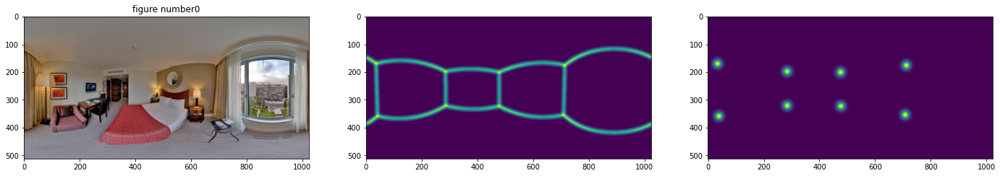

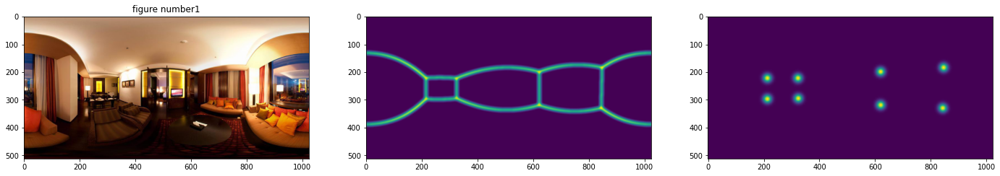

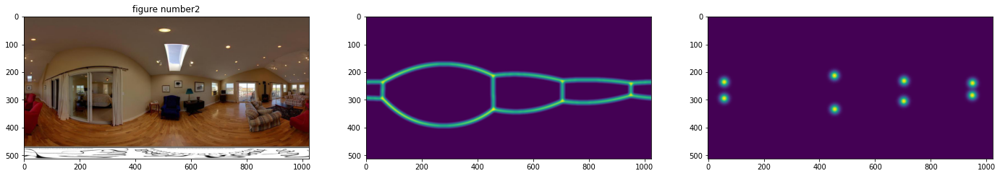

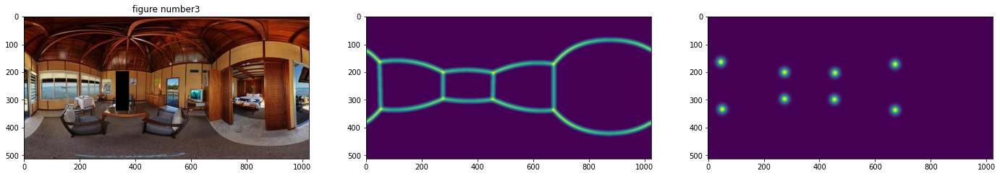

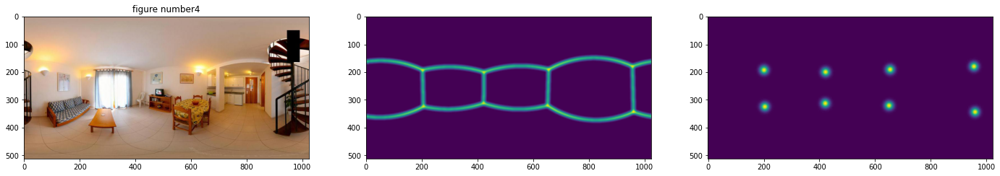

...

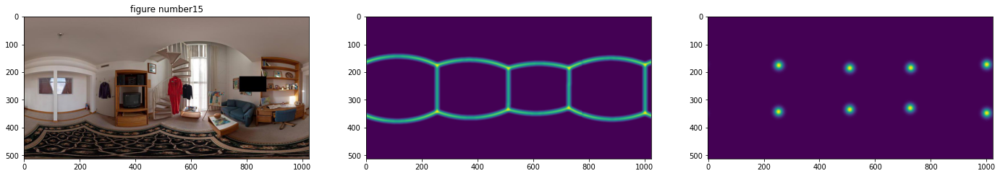

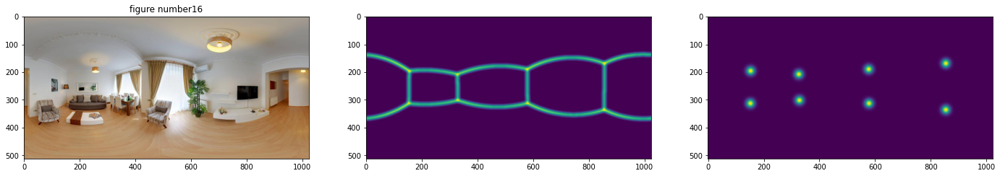

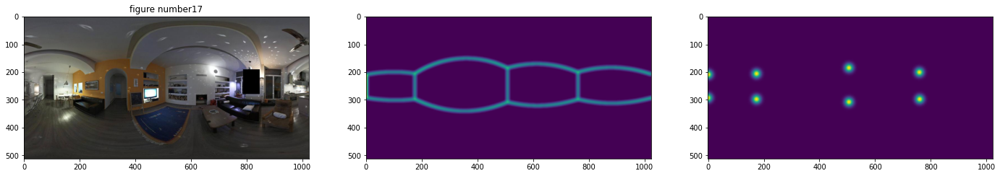

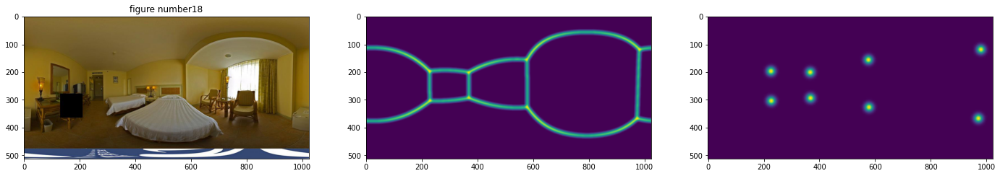

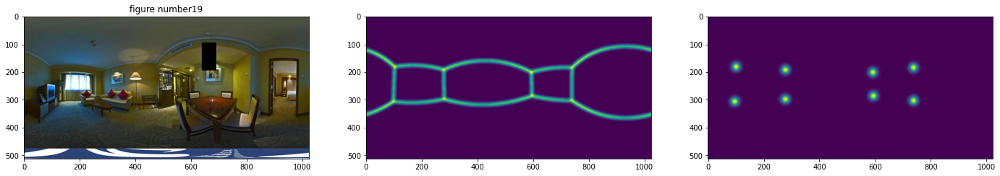

In [ ]:
"""plotting transformed images"""
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import os
images = os.listdir('result/RGB')
images.sort()
edges = os.listdir('result/EM')
edges.sort()
corners = os.listdir('result/CM')
corners.sort()
imgpaths=[]
empaths=[]
cmpaths=[]
for image, edge, corner in zip(images,edges,corners):
    imgpaths.append(os.path.join('result/RGB/',image))
    empaths.append(os.path.join('result/EM/',edge))
    cmpaths.append(os.path.join('result/CM/',corner))




for i, image in enumerate(zip (imgpaths,empaths,cmpaths)):
    fig,ax =plt.subplots(nrows=1,ncols=3,figsize=(24, 8))
    img = Image.open(image[0])
    em = Image.open(image[1])
    cm = Image.open(image[2])
    plt.sca(ax[0])
    plt.imshow(img)
    plt.title('figure number{}'.format((i)))
    plt.sca(ax[1])
    plt.imshow(em)
    plt.sca(ax[2])
    plt.imshow(cm)
    plt.show()

In [ ]:
%cd CFLPytorch

/content/CFLPytorch


#Visualising predicted maps

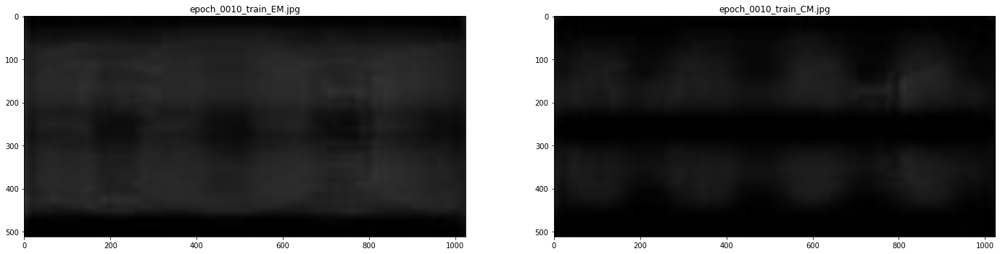

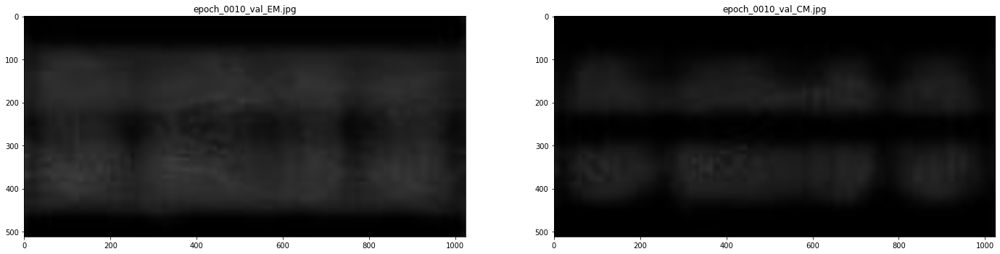

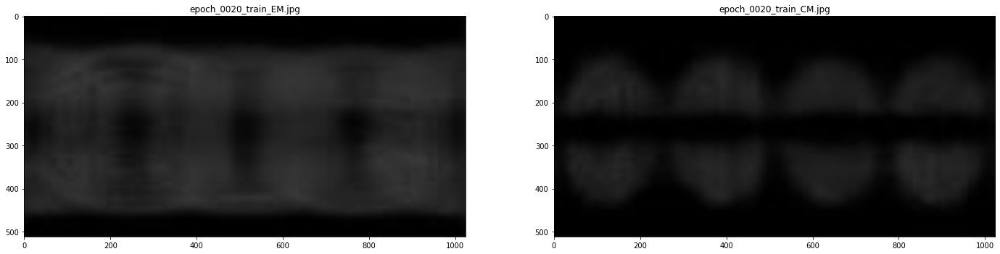

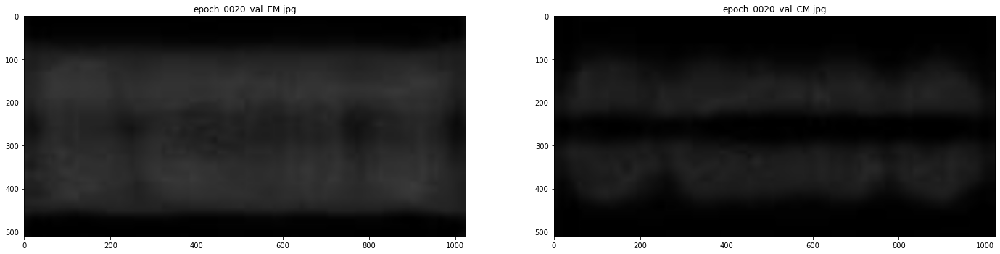

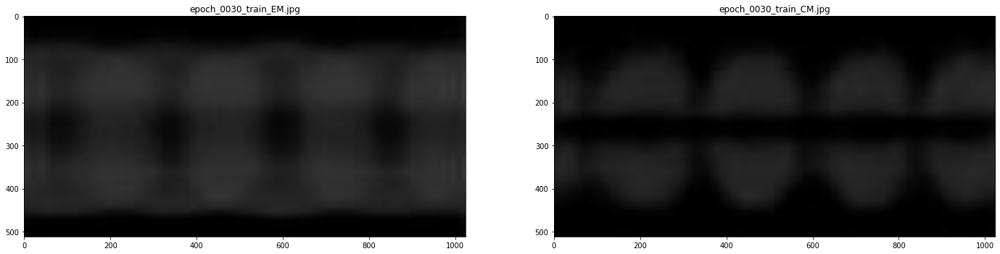

...

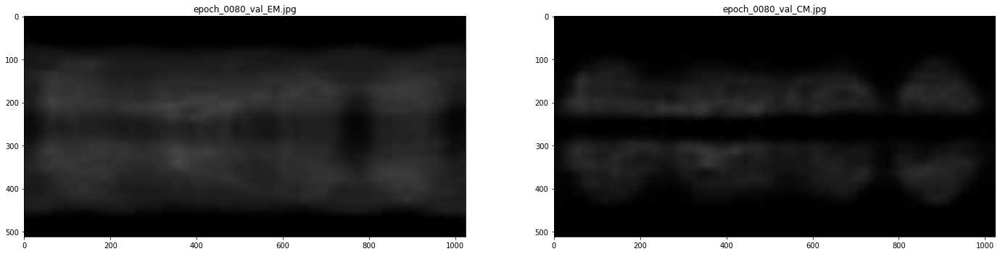

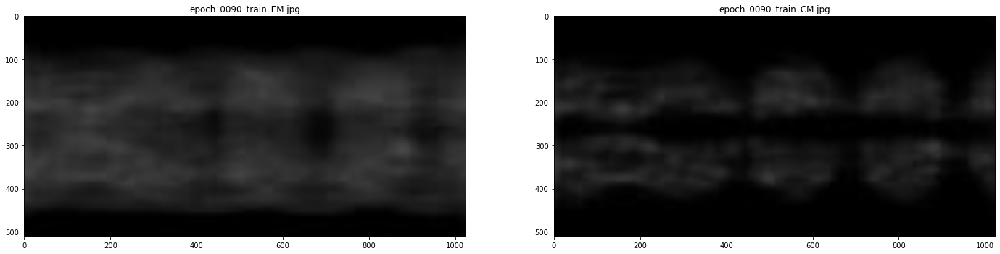

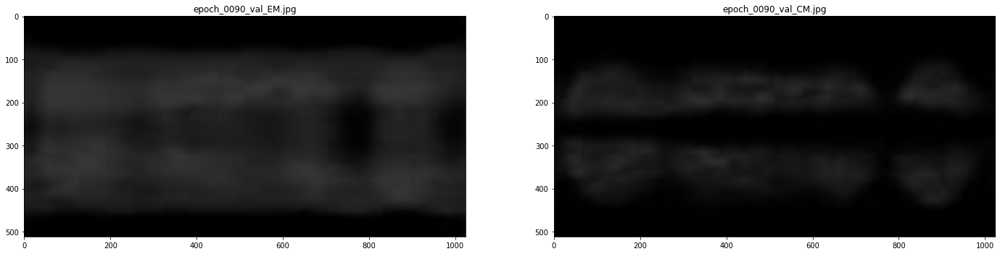

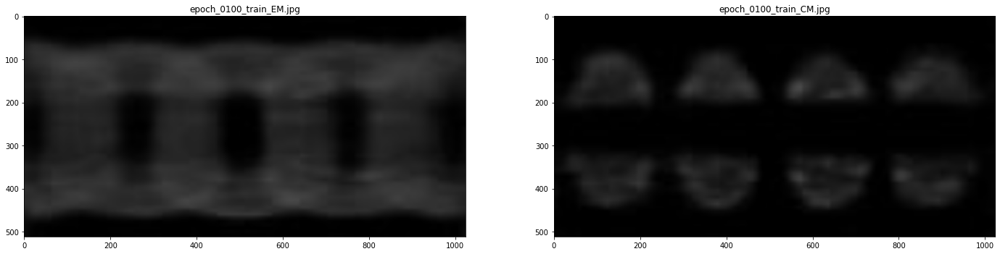

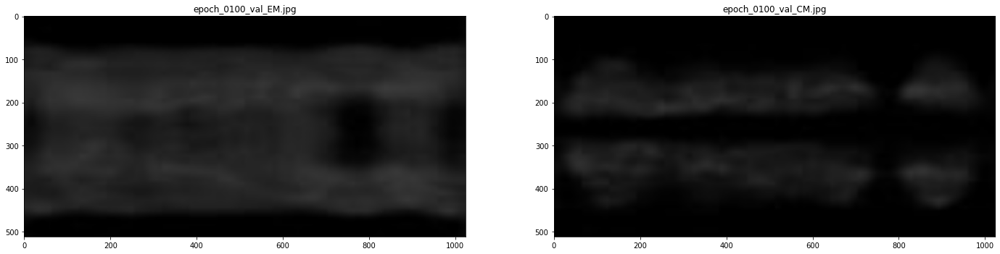

In [ ]:
'''This cell is for visualising the predicted edge maps and corner maps'''
%matplotlib inline
import matplotlib.pyplot as plt
import cv2
import os
root1="EM_pred"
images1 = os.listdir(root1)
images1.sort()

root2="CM_pred"
images2 = os.listdir(root2)
images2.sort()

for i, img in enumerate(zip(images1,images2)):
    fig,ax =plt.subplots(nrows=1,ncols=2,figsize=(24, 8))
    pathE = os.path.join(root1,img[0])
    pathC = os.path.join(root2,img[1])
    edge= cv2.imread(pathE)
    edge = cv2.resize(edge,(1024,512))
    corner= cv2.imread(pathC)
    corner = cv2.resize(corner,(1024,512))
    plt.sca(ax[0])
    plt.imshow(edge)
    plt.title('{}'.format(img[0]))
    plt.sca(ax[1])
    plt.imshow(corner)
    plt.title('{}'.format(img[1]))
    plt.show()

In [ ]:
!cp -r CM_pred /content/drive/"My Drive"/
!cp -r EM_pred /content/drive/"My Drive"/

# Evaluate

The same as training, the next cell is to modify the testing/inference script. The current script outputs the performance metrics of the trained model. (accuracy, IoU, precision. recall)  

In [ ]:
%%writefile /content/CFLPytorch/test_CFL.py
from CFLPytorch.StdConvsCFL import StdConvsCFL
from CFLPytorch.EquiConvsCFL import EquiConvsCFL
from CFLPytorch.resnet import StdConvsCFL as Res50Std 
import argparse
import logging
#import sagemaker_containers
import os
import torch
import torch.distributed as dist
import torch.nn as nn
import torch.nn.parallel
import torch.optim
import torch.utils.data
import torch.utils.data.distributed
import torchvision
import torchvision.models
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
import pandas as pd
from skimage.feature import corner_peaks, peak_local_max
#from CFLPytorch.offsetcalculator import offcalc

logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)


eps = 1e-10 # epsilon to improve numerical stability

def evaluate(pred, gt):
    """
    if map == 'edges':
        prediction_path_list = glob.glob(os.path.join(args.results,'EM_test')+'/*.jpg')
        gt_path_list = glob.glob(os.path.join(args.dataset, 'EM_gt')+'/*.jpg')
    if map == 'corners':
        prediction_path_list = glob.glob(os.path.join(args.results,'CM_test')+'/*.jpg')
        gt_path_list = glob.glob(os.path.join(args.dataset, 'CM_gt')+'/*.jpg')
    prediction_path_list.sort()
    gt_path_list.sort()
    """

    #P, R, Acc, f1, IoU = [], [], [], [], []
    # predicted image
    #prediction = Image.open(prediction_path_list[im])
    #pred_H, pred_W = pred.shape[0], pred.shape[1]
    #prediction = torch.tensor(prediction)/255.
    

    # gt image
    #gt = Image.open(gt_path_list[im])
    #gt = gt.resize([pred_W, pred_H])
    #gt = torch.tensor(gt)/255.
    gt = (gt.ge(0.1)).int()

    th=0.1
    gtpos=gt.eq(1)
    gtneg=gt.eq(0)
    predgt=pred.gt(th)
    predle=pred.le(th)
    tp = torch.sum((gtpos & predgt).float())
    tn = torch.sum((gtneg & predle).float())
    fp = torch.sum((gtneg & predgt).float())
    fn = torch.sum((gtpos & predle).float())

    # How accurate the positive predictions are
    #P.append(tp / (tp + fp))
    P = tp / (tp + fp)
    # Coverage of actual positive sample
    #R.append(tp / (tp + fn))
    R = (tp / (tp + fn))
    # Overall performance of model
    #Acc.append((tp + tn) / (tp + tn + fp + fn))
    Acc = ((tp + tn) / (tp + tn + fp + fn))
    # Hybrid metric useful for unbalanced classes 
    #f1.append(2 * (tp / (tp + fp))*(tp / (tp + fn))/((tp / (tp + fp))+(tp / (tp + fn))))
    f1 = (2 * (tp / (tp + fp))*(tp / (tp + fn))/((tp / (tp + fp))+(tp / (tp + fn))))
    # Intersection over Union
    #IoU.append(tp / (tp + fp + fn))
    IoU = (tp / (tp + fp + fn))
      

    #return torch.mean(P), torch.mean(R), torch.mean(Acc), torch.mean(f1), torch.mean(IoU)
    return P, R, Acc, f1, IoU

class SUN360Dataset(Dataset):
    

    def __init__(self, file, transform=None, target_transform=None, joint_transform=None):
        """
        Args:
            json_file (string): Path to the json file with annotations.
            transform (callable, optional): Optional transform to be applied
                on an image.
            target_file (callable, optional): Optional transform to be applied
                on a map (edge and corner).    
        """
    
        self.images_data = pd.read_json(file)    
        self.transform = transform
        self.target_transform = target_transform
        self.joint_transform = joint_transform

    def __len__(self):
        return len(self.images_data)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.images_data.iloc[idx, 0]                        
        EM_name = self.images_data.iloc[idx, 1]
        CM_name = self.images_data.iloc[idx, 2]
        CL_name = self.images_data.iloc[idx, 3]
        image = Image.open(img_name)
        if image.mode !='RGB' :
            image = image.convert('RGB')
        EM = Image.open(EM_name)
        CM = Image.open(CM_name)
        with open(CL_name, mode='r') as f:
            cor = np.array([line.strip().split() for line in f], np.int32)
        if(len(cor)%2 != 0) :
            print (CL_name.split('/')[-1])    
        
        """
        EM = np.asarray(EM)
        EM = np.expand_dims(EM, axis=2)
        CM = np.asarray(CM) 
        CM = np.expand_dims(CM, axis=2) 
        gt = np.concatenate((EM,CM),axis = 2)
        maps = Image.fromarray(gt)
        """
        
        if self.transform is not None:
            image = self.transform(image)
        
        if self.target_transform is not None:
            CM = self.target_transform(CM)
            EM = self.target_transform(EM)
        if self.joint_transform is not None:   
            image, EM, CM, cor = self.joint_transform([image, EM, CM, cor])      
        
        return image, EM, CM


def corners_2_xy(outputs):
    output = outputs['output'] + eps
    output = torch.sigmoid(output)
    edges,corners =torch.chunk(output,2,dim=1)
    corner1= 255* corners
    corner1[corner1>127] = 255
    corner1[corner1<127] = 0
    corner1 = torch.cat((corner1,corner1,corner1),dim=-1)
    corner1 = torch.squeeze(corner1)
    array = corner1.detach().cpu().numpy().astype(np.uint8)
    local_peaks = corner_peaks(array, min_distance=5, threshold_rel=0.5, indices=True)
    local_peaks = np.array(local_peaks, dtype=np.float64)
    height, width = array.shape
    width /=3
    col1m = (local_peaks[:,1]>=width) & (local_peaks[:,1]<2*width)
    peaks = local_peaks[col1m] 
    peaks[:,0]/=height
    peaks[:,1]-= width
    peaks[:,1]/= width
    return peaks 


def map_predict(outputs, EM_gt,CM_gt):
    '''
    function to calculate total loss according to CFL paper
    '''
    output= outputs['output'] + eps
    output = torch.sigmoid(output)
    EM=F.interpolate(EM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
    CM=F.interpolate(CM_gt,size=(output.shape[-2],output.shape[-1]),mode='bilinear',align_corners=True)
    edges,corners =torch.chunk(output,2,dim=1)
    #edges,corners = torch.squeeze(edges,dim=1), torch.squeeze(corners,dim=1) 
    #EM,CM = torch.squeeze(EM,dim=1), torch.squeeze(CM,dim=1)
    P_e, R_e, Acc_e, f1_e, IoU_e = evaluate(edges,EM)
    #print('EDGES: IoU: ' + str('%.3f' % IoU_e) + '; Accuracy: ' + str('%.3f' % Acc_e) + '; Precision: ' + str('%.3f' % P_e) + '; Recall: ' + str('%.3f' % R_e) + '; f1 score: ' + str('%.3f' % f1_e))
    P_c, R_c, Acc_c, f1_c, IoU_c = evaluate(corners, CM)
    #print('CORNERS: IoU: ' + str('%.3f' % IoU_c) + '; Accuracy: ' + str('%.3f' % Acc_c) + '; Precision: ' + str('%.3f' % P_c) + '; Recall: ' + str('%.3f' % R_c) + '; f1 score: ' + str('%.3f' % f1_c))
    
    P_e_np = P_e.cpu().numpy()
    R_e_np = R_e.cpu().numpy()
    Acc_e_np = Acc_e.cpu().numpy()
    f1_e_np = f1_e.cpu().numpy()
    IoU_e_np = IoU_e.cpu().numpy()
    
    P_c_np = P_c.cpu().numpy()
    R_c_np = R_c.cpu().numpy()
    Acc_c_np = Acc_c.cpu().numpy()
    f1_c_np = f1_c.cpu().numpy()
    IoU_c_np = IoU_c.cpu().numpy() 

    return P_e_np, R_e_np, Acc_e_np, f1_e_np, IoU_e_np, P_c_np, R_c_np, Acc_c_np, f1_c_np, IoU_c_np

def _test(args):
    """
    is_distributed = len(args.hosts) > 1 and args.dist_backend is not None
    logger.debug("Distributed training - {}".format(is_distributed))

    if is_distributed:
        # Initialize the distributed environment.
        world_size = len(args.hosts)
        os.environ['WORLD_SIZE'] = str(world_size)
        host_rank = args.hosts.index(args.current_host)
        os.environ['RANK'] = str(host_rank)
        dist.init_process_group(backend=args.dist_backend, rank=host_rank, world_size=world_size)
        logger.info(
            'Initialized the distributed environment: \'{}\' backend on {} nodes. '.format(
                args.dist_backend,
                dist.get_world_size()) + 'Current host rank is {}. Using cuda: {}. Number of gpus: {}'.format(
                dist.get_rank(), torch.cuda.is_available(), args.num_gpus))
    """            

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    logger.info("Device Type: {}".format(device))
    img_size= [128,256]
    logger.info("Loading SUN360 dataset")
    transform = transforms.Compose(
        [transforms.Resize((img_size[0],img_size[1])),
         transforms.ToTensor(),
         transforms.Normalize(mean=[0.485, 0.458, 0.408], std=[1.0, 1.0, 1.0])])
    target_transform = transforms.Compose([transforms.Resize((img_size[0],img_size[1])),
                                           transforms.ToTensor()])     

    testset = SUN360Dataset("validationdatastruct.json",transform = transform, target_transform = target_transform)
    test_loader = DataLoader(testset, batch_size=args.batch_size,
                                               shuffle=False, num_workers=args.workers)
                                              
    
    logger.info("Model loaded")
    if args.conv_type == "Std":
        model = StdConvsCFL(args.model_name,conv_type=args.conv_type, layerdict=None, offsetdict=None)
        #model = Res50Std()
    elif args.conv_type == "Equi":                           
        layerdict, offsetdict = torch.load('layertest.pt'), torch.load('offsettest.pt')
        model = EquiConvsCFL(args.model_name,conv_type=args.conv_type, layerdict=layerdict, offsetdict=offsetdict)
    model.load_state_dict(torch.load(args.modelfile))

    if torch.cuda.device_count() > 1:
        logger.info("Gpu count: {}".format(torch.cuda.device_count()))
        model = nn.DataParallel(model)

    with torch.no_grad():
        model = model.to(device)
        Pe, Re, Acce, f1e, IoUe = [], [], [], [], []
        Pc, Rc, Accc, f1c, IoUc = [], [], [], [], []
        for i, data in enumerate(test_loader):
            # get the inputs
            inputs, EM , CM = data
            inputs, EM, CM = inputs.to(device), EM.to(device), CM.to(device)
            model.eval()
            outputs = model(inputs)
            #detection= corners_2_xy(outputs)
            #print(len(detection))
            P_e_np, R_e_np, Acc_e_np, f1_e_np, IoU_e_np, P_c_np, R_c_np, Acc_c_np, f1_c_np, IoU_c_np = map_predict(outputs,EM,CM)
            
            Pe.append(P_e_np)
            Re.append(R_e_np)
            Acce.append(Acc_e_np)
            f1e.append(f1_e_np)
            IoUe.append(IoU_e_np)

            Pc.append(P_c_np)
            Rc.append(R_c_np)
            Accc.append(Acc_c_np)
            f1c.append(f1_c_np)
            IoUc.append(IoU_c_np)
        
        P_e = np.mean(Pe)
        R_e = np.mean(Re)
        Acc_e = np.mean(Acce)
        f1_e = np.mean(f1e)
        IoU_e = np.mean(IoUe)

        P_c = np.mean(Pc)
        R_c = np.mean(Rc)
        Acc_c = np.mean(Accc)
        f1_c = np.mean(f1c)
        IoU_c = np.mean(IoUc) 
        
        print('EDGES: IoU: ' + str('%.3f' % IoU_e) + '; Accuracy: ' + str('%.3f' % Acc_e) + '; Precision: ' + str('%.3f' % P_e) + '; Recall: ' + str('%.3f' % R_e) + '; f1 score: ' + str('%.3f' % f1_e))
        print('CORNERS: IoU: ' + str('%.3f' % IoU_c) + '; Accuracy: ' + str('%.3f' % Acc_c) + '; Precision: ' + str('%.3f' % P_c) + '; Recall: ' + str('%.3f' % R_c) + '; f1 score: ' + str('%.3f' % f1_c))
    print('Finished Testing')
    


def _save_model(model, model_dir):
    logger.info("Saving the model.")
    path = os.path.join(model_dir, 'model.pth')
    # recommended way from http://pytorch.org/docs/master/notes/serialization.html
    torch.save(model.cpu().state_dict(), path)


def model_fn(model_dir):
    logger.info('model_fn')
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = StdConvsCFL('efficient-b0',conv_type='Std')
    if torch.cuda.device_count() > 1:
        logger.info("Gpu count: {}".format(torch.cuda.device_count()))
        model = nn.DataParallel(model)

    with open(os.path.join(model_dir, 'model.pth'), 'rb') as f:
        model.load_state_dict(torch.load(f))
    return model.to(device)


if __name__ == '__main__':
    parser = argparse.ArgumentParser()

    parser.add_argument('--workers', type=int, default=2, metavar='W',
                        help='number of data loading workers (default: 2)')
    parser.add_argument('--batch_size', type=int, default=1, metavar='BS',
                        help='batch size (default: 1)')
    parser.add_argument('--model-dir', type=str, default="")
    parser.add_argument('--model-name', type=str, default="efficientnet-b0")
    parser.add_argument('--conv_type', type=str,default="Std", help='select convolution type between Std and Equi. Also determines the network type')
    parser.add_argument('--modelfile', type=str, default="model_epoch100.pth", help="load model file for inference")
    #parser.add_argument('--dist_backend', type=str, default='gloo', help='distributed backend (default: gloo)')

    #env = sagemaker_containers.training_env()
    #parser.add_argument('--hosts', type=list, default=env.hosts)
    #parser.add_argument('--current-host', type=str, default=env.current_host)
    #parser.add_argument('--model-dir', type=str, default=env.model_dir)
    #parser.add_argument('--data-dir', type=str, default=env.channel_input_dirs.get('training'))
    #parser.add_argument('--num-gpus', type=int, default=env.num_gpus)

    _test(parser.parse_args())

Overwriting /content/CFLPytorch/test_CFL.py


In [ ]:
# before running the testing program, make sure the model filename to be tested exists in the directory
!python3 test_CFL.py --conv_type "Std" --modelfile "model_EfficientNetb0_epoch100.pth"

Loaded pretrained weights for efficientnet-b0
EDGES: IoU: 0.162; Accuracy: 0.479; Precision: 0.166; Recall: 0.866; f1 score: 0.278
CORNERS: IoU: 0.062; Accuracy: 0.814; Precision: 0.065; Recall: 0.607; f1 score: nan
Finished Testing
